In [473]:
# from nbdev.showdoc import *
import numpy as np
from tqdm import trange
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [474]:
def cnn_curvature(
    A:np.ndarray, # a binarized adjacency matrix
):
    # first, in inefficient implementation to test the idea
    # iterate through each point
    cnn = np.zeros(len(A))
    local_density = np.zeros(len(A))
    for i in trange(len(A)):
        neighbors = A[i].nonzero()[0]
        neighbors_of_neighbors = np.zeros(len(A))
        for j in neighbors:
            nn = A[j].nonzero()
            for k in nn:
                neighbors_of_neighbors[k] += 1
        k = sum(neighbors_of_neighbors[neighbors_of_neighbors >= 1])
        cnn[i] = k
        local_density[i] = len(neighbors)
    # normalize by squared average density
    average_num_neighbors = np.sum(A)/len(A)
    cnn = cnn / average_num_neighbors**2
    return cnn, local_density

In [490]:
from diffusion_curvature.datasets import torus
from diffusion_curvature.core import diffusion_matrix, plot_3d, gaussian_kernel
X, ks = torus(n=500, use_guide_points=True)
A = gaussian_kernel(X,kernel_type="adaptive anisotropic",k=20)
A_binarized = (A > np.sort(A.flatten())[::-1][len(A)*10]).astype(int)
np.fill_diagonal(A_binarized, 0)

In [491]:
ks, local_density = cnn_curvature(A_binarized)

100%|██████████| 259/259 [00:00<00:00, 33865.10it/s]


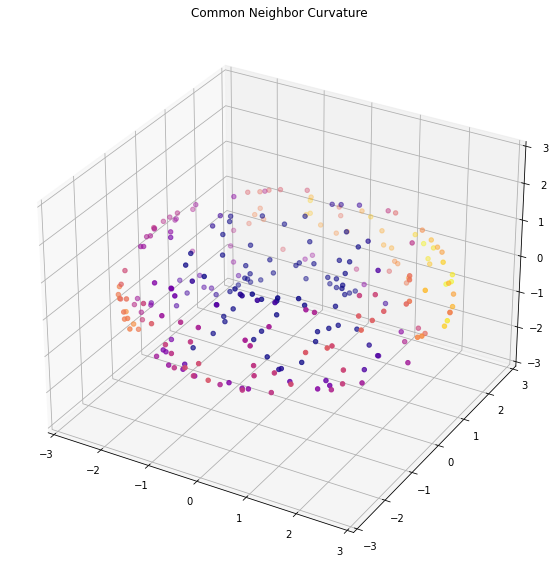

In [497]:
plot_3d(X,distribution=ks,title="Common Neighbor Curvature",use_plotly=False)


In [498]:
def smooth_curvatures(A, ks, smoothing=1):
    # Applies a high pass filter to the curvature
    # Can use the weighted adjacency matrix
    D = np.diag(1/A.sum(1))
    P = D @ A
    for i in range(smoothing):
        ks = ks @ P
    return ks.squeeze()

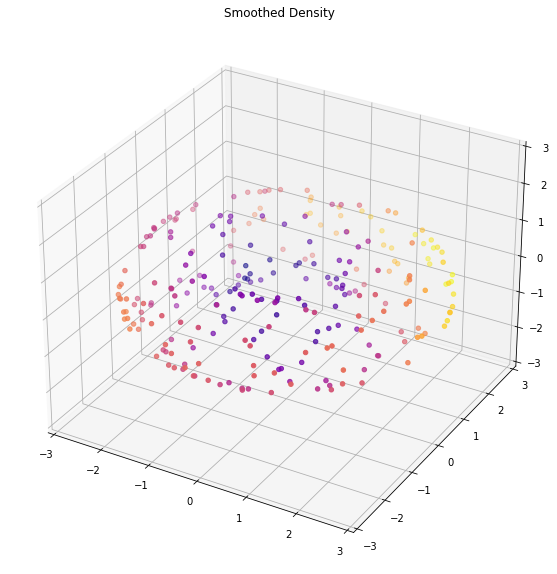

In [499]:
density_smoothed = smooth_curvatures(A,local_density)
plot_3d(X,distribution=density_smoothed,title="Smoothed Density")

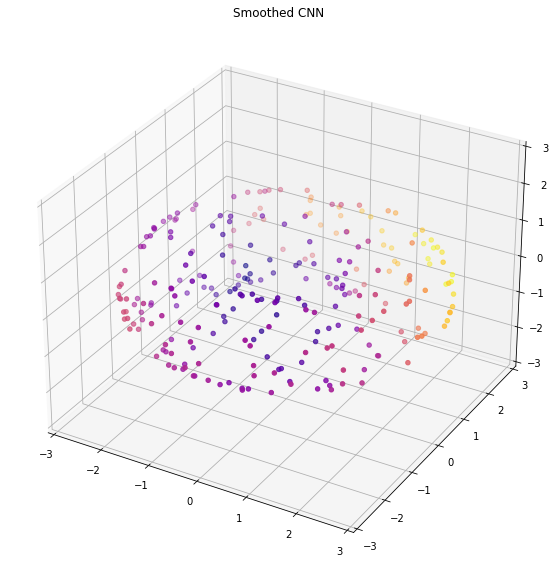

In [500]:
ks_smoothed = smooth_curvatures(A,ks)
plot_3d(X,distribution=ks_smoothed,title="Smoothed CNN", use_plotly=False)

In [481]:
ks_smoothed.shape

(2494,)

In [482]:
X.shape

(2494, 3)

In [483]:
max(ks)

3.8252431420074444

In [484]:
min(ks)

0.0

In [485]:
np.mean(ks)

1.2325795435969018

In [486]:
def summary_for_dataset(X):
    A = gaussian_kernel(X,kernel_type="adaptive anisotropic",k=20)
    A_binarized = (A > np.sort(A.flatten())[::-1][len(A)*10]).astype(int)
    np.fill_diagonal(A_binarized, 0)
    ks, local_density = cnn_curvature(A_binarized)
    density_smoothed = smooth_curvatures(A,local_density)
    plot_3d(X,distribution=density_smoothed,title="Smoothed Density")
    ks_smoothed = smooth_curvatures(A,ks)
    plot_3d(X,distribution=ks_smoothed,title="Smoothed CNN", use_plotly=False)

In [487]:
from diffusion_curvature.datasets import hyperboloid, paraboloid, ellipsoid

100%|██████████| 10000/10000 [00:01<00:00, 5150.19it/s]


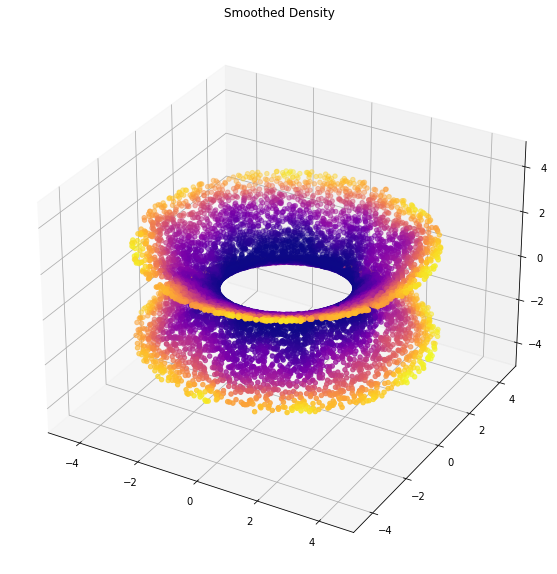

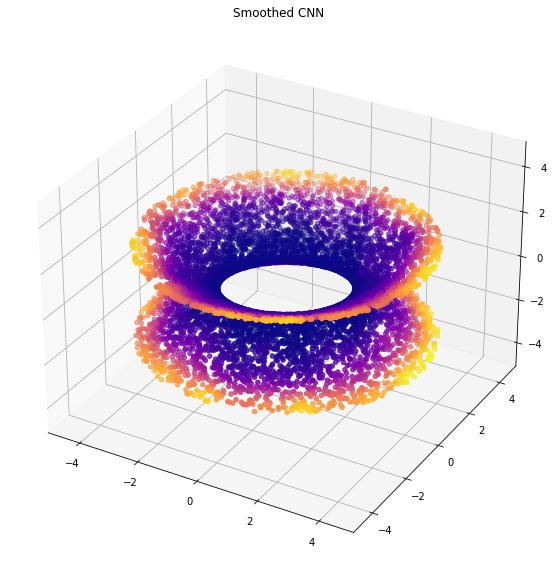

In [488]:
X, ks = hyperboloid(n=10000)
summary_for_dataset(X)

100%|██████████| 10000/10000 [00:01<00:00, 5143.71it/s]


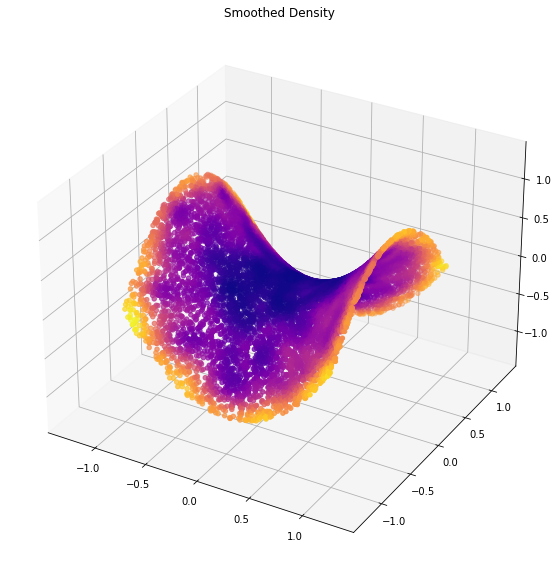

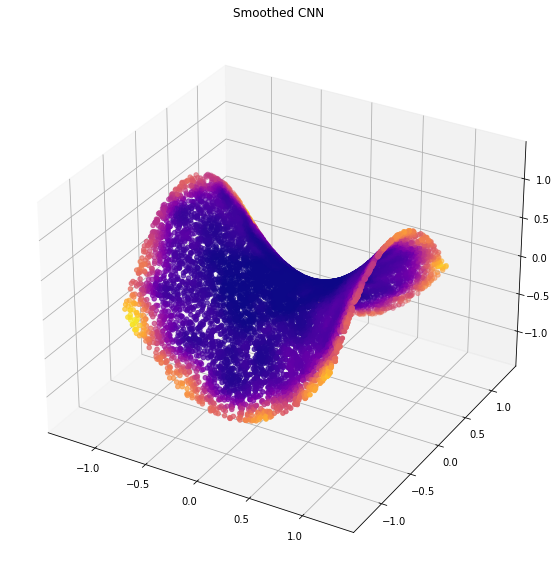

In [489]:
X, ks = paraboloid(n=10000)
summary_for_dataset(X)